In [1]:
import torch
import intel_extension_for_pytorch as ipex
from torch import nn
import numpy as np
import matplotlib.pyplot as plt

J:\Coding\Codes\python\deepLearning\.venv\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: ''If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [2]:
device = "xpu" if torch.xpu.is_available() else "cpu"
print(f"Device: {device}")

Device: xpu


In [3]:
def plot_predictions(train_data, train_labels, test_data, test_labels, predictions = None):
    
    plt.figure(figsize=(10, 7))
    
    plt.scatter(train_data, train_labels, c="r", s=4, label = "Training data")
    
    plt.scatter(test_data, test_labels, c="g", s=4, label = "Test data")
    
    #check if there are predictions
    if predictions is not None:
        # plot predictions if they exist
        plt.scatter(test_data, predictions, c="y", s=4, label="Predictions")
        
    plt.legend(prop={"size": 14})

In [4]:
weight = 12.3
bias = 0.939
const = 56

# create range values
start = -2
end = 2
step = 0.004


X = torch.arange(start, end, step).unsqueeze(dim=1) 

Y = torch.arange(start, end, step).unsqueeze(dim=1)

z = weight * X * X + bias * Y + const
print(X[:10], Y[:10], z[:10])
print(len(X), len(Y), len(z))

tensor([[-2.0000],
        [-1.9960],
        [-1.9920],
        [-1.9880],
        [-1.9840],
        [-1.9800],
        [-1.9760],
        [-1.9720],
        [-1.9680],
        [-1.9640]]) tensor([[-2.0000],
        [-1.9960],
        [-1.9920],
        [-1.9880],
        [-1.9840],
        [-1.9800],
        [-1.9760],
        [-1.9720],
        [-1.9680],
        [-1.9640]]) tensor([[103.3220],
        [103.1292],
        [102.9367],
        [102.7446],
        [102.5530],
        [102.3617],
        [102.1708],
        [101.9803],
        [101.7902],
        [101.6006]])
1000 1000 1000


In [5]:
train_split = int(0.8 * len(X))

X_train, y_train, z_train = X[:train_split], Y[:train_split], z[:train_split]

X_test, y_test, z_test = X[train_split:], Y[train_split:], z[train_split:]
len(X_train), len(y_train), len(z_train), len(X_test), len(y_test), len(z_test)

(800, 800, 800, 200, 200, 200)

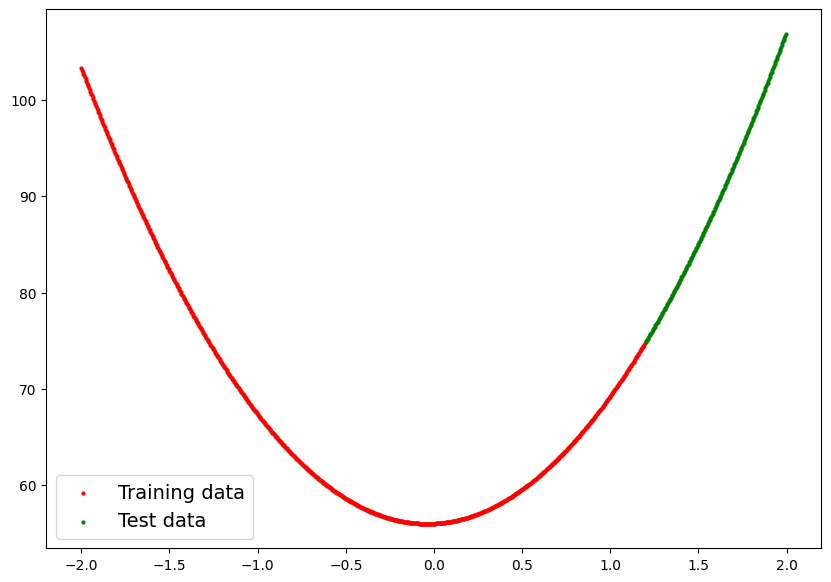

In [6]:
plot_predictions(X_train, z_train, X_test, z_test)

In [7]:
class LinearRegressionModel(nn.Module): 
    def __init__(self):
        super().__init__()
        self.weights = nn.Parameter(torch.randn(1, requires_grad = True, dtype = torch.float))
        self.bias = nn.Parameter(torch.randn(1, requires_grad = True, dtype = torch.float))
        self.const = nn.Parameter(torch.randn(1, requires_grad = True, dtype = torch.float))
        
 
    def forward(self, x: torch.Tensor, y: torch.tensor) -> (torch.Tensor, torch.Tensor): 
        return self.weights * x * x + self.bias * y + self.const 

In [8]:
torch.manual_seed(420)

model_0 = LinearRegressionModel()

list(model_0.parameters()) 

[Parameter containing:
 tensor([-1.6977], requires_grad=True),
 Parameter containing:
 tensor([0.6374], requires_grad=True),
 Parameter containing:
 tensor([0.0781], requires_grad=True)]

In [9]:
model_0.state_dict()

OrderedDict([('weights', tensor([-1.6977])),
             ('bias', tensor([0.6374])),
             ('const', tensor([0.0781]))])

In [10]:
with torch.inference_mode():
    z_preds = model_0(X_test, y_test)
    
z_preds

tensor([[-1.6016],
        [-1.6154],
        [-1.6292],
        [-1.6431],
        [-1.6570],
        [-1.6710],
        [-1.6851],
        [-1.6992],
        [-1.7133],
        [-1.7275],
        [-1.7418],
        [-1.7561],
        [-1.7705],
        [-1.7849],
        [-1.7994],
        [-1.8139],
        [-1.8285],
        [-1.8432],
        [-1.8579],
        [-1.8726],
        [-1.8874],
        [-1.9023],
        [-1.9172],
        [-1.9322],
        [-1.9472],
        [-1.9623],
        [-1.9774],
        [-1.9926],
        [-2.0078],
        [-2.0231],
        [-2.0385],
        [-2.0539],
        [-2.0693],
        [-2.0849],
        [-2.1004],
        [-2.1160],
        [-2.1317],
        [-2.1475],
        [-2.1632],
        [-2.1791],
        [-2.1950],
        [-2.2109],
        [-2.2269],
        [-2.2430],
        [-2.2591],
        [-2.2753],
        [-2.2915],
        [-2.3077],
        [-2.3241],
        [-2.3405],
        [-2.3569],
        [-2.3734],
        [-2.

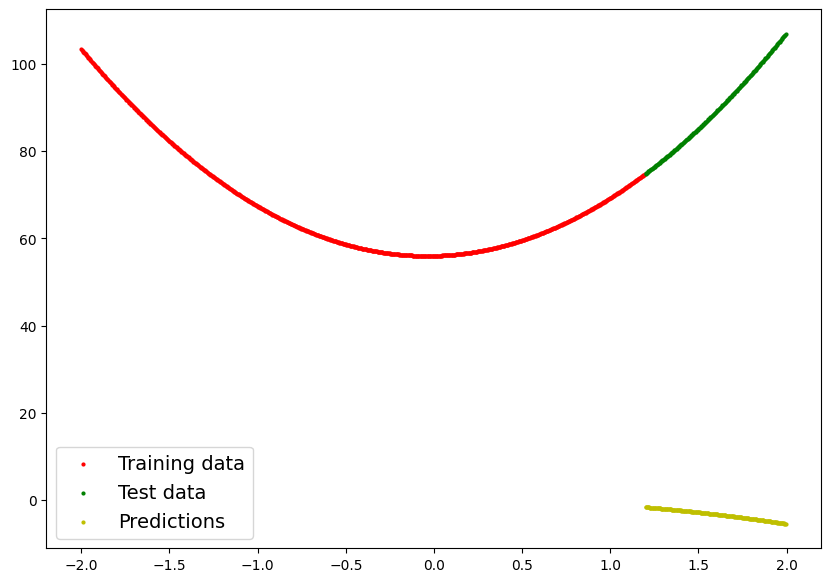

In [11]:
plot_predictions(X_train, z_train, X_test, z_test,predictions=z_preds)

In [12]:
#loss_fn = nn.SmoothL1Loss()
#loss_fn = nn.L1Loss()
loss_fn = nn.MSELoss()
loss_fn

MSELoss()

In [13]:
optimizer = torch.optim.SGD(params=model_0.parameters(), lr = 0.0001)
optimizer

SGD (
Parameter Group 0
    dampening: 0
    differentiable: False
    foreach: None
    lr: 0.0001
    maximize: False
    momentum: 0
    nesterov: False
    weight_decay: 0
)

In [14]:
device = "cpu"
device

'cpu'

In [15]:
model_0 = model_0.to(device)

In [16]:
loss_fn = loss_fn.to(device)

In [17]:
#model_0, optimizer = ipex.optimize(model_0, optimizer=optimizer)

In [18]:
print(next(model_0.parameters()).device)

cpu


In [19]:
model_0.state_dict()

OrderedDict([('weights', tensor([-1.6977])),
             ('bias', tensor([0.6374])),
             ('const', tensor([0.0781]))])

In [20]:
X_train,y_train, z_train, X_test, y_test, z_test = X_train.to(device),y_train.to(device), z_train.to(device), X_test.to(device), y_test.to(device), z_test.to(device)

In [21]:
%%time
epochs = 50000

epoch_count = []
loss_values = []
test_loss_values = []

for epoch in range(epochs):
    model_0.train()
    z_pred = model_0(X_train, y_train)
    loss = loss_fn(z_pred, z_train)
    print(f"Loss: {loss}")
    optimizer.zero_grad()
    loss.backward()
    optimizer.step() 
    
    model_0.eval()
    with torch.inference_mode(): 
        test_pred = model_0(X_test, y_test)

        test_loss = loss_fn(test_pred, z_test)
        
    epoch_count.append(epoch)
    loss_values.append(loss)
    test_loss_values.append(test_loss)
        
    print(f"Epoch: {epoch} | Loss: {loss} | Test loss: {test_loss}")   
    
    print(model_0.state_dict())

Loss: 5117.53662109375
Epoch: 0 | Loss: 5117.53662109375 | Test loss: 8729.064453125
OrderedDict([('weights', tensor([-1.6803])), ('bias', tensor([0.6299])), ('const', tensor([0.0921]))])
Loss: 5112.00732421875
Epoch: 1 | Loss: 5112.00732421875 | Test loss: 8720.068359375
OrderedDict([('weights', tensor([-1.6630])), ('bias', tensor([0.6224])), ('const', tensor([0.1061]))])
Loss: 5106.48583984375
Epoch: 2 | Loss: 5106.48583984375 | Test loss: 8711.083984375
OrderedDict([('weights', tensor([-1.6457])), ('bias', tensor([0.6150])), ('const', tensor([0.1201]))])
Loss: 5100.970703125
Epoch: 3 | Loss: 5100.970703125 | Test loss: 8702.109375
OrderedDict([('weights', tensor([-1.6283])), ('bias', tensor([0.6075])), ('const', tensor([0.1341]))])
Loss: 5095.462890625
Epoch: 4 | Loss: 5095.462890625 | Test loss: 8693.14453125
OrderedDict([('weights', tensor([-1.6111])), ('bias', tensor([0.6000])), ('const', tensor([0.1480]))])
Loss: 5089.96142578125
Epoch: 5 | Loss: 5089.96142578125 | Test loss: 86

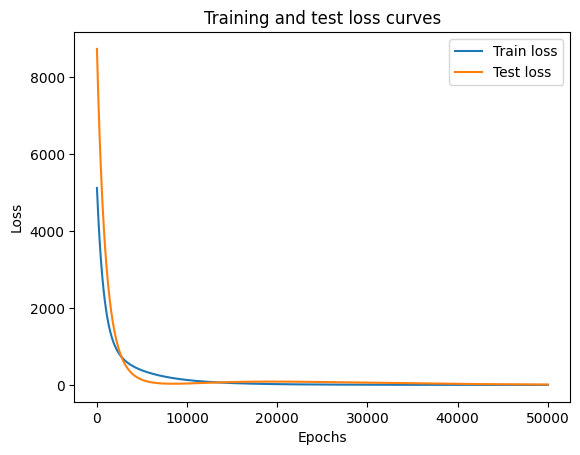

In [22]:
import numpy as np

plt.plot(epoch_count, np.array(torch.tensor(loss_values).cpu().numpy()), label="Train loss")
plt.plot(epoch_count, test_loss_values, label="Test loss")
plt.title('Training and test loss curves')
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend();

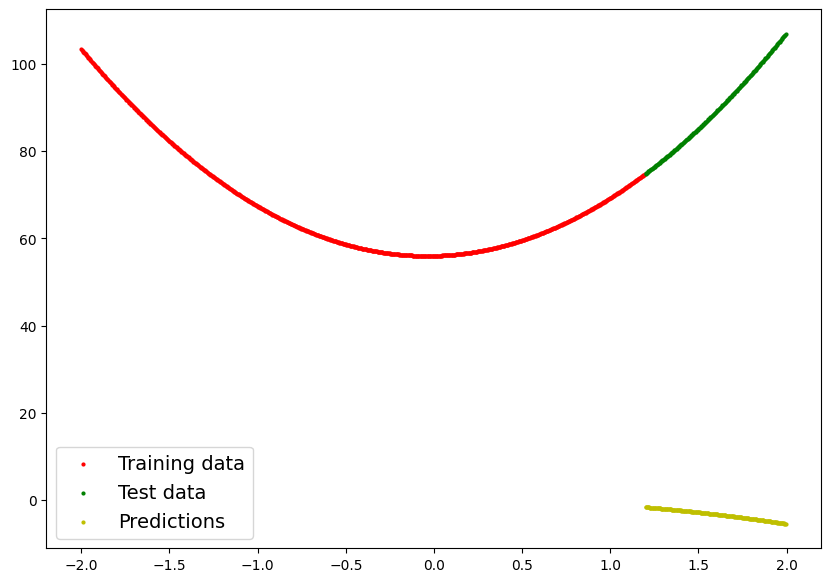

In [23]:
plot_predictions(X_train, z_train, X_test, z_test, predictions=z_preds)

In [24]:
with torch.inference_mode():
    z_preds_new = model_0(X_test, y_test)

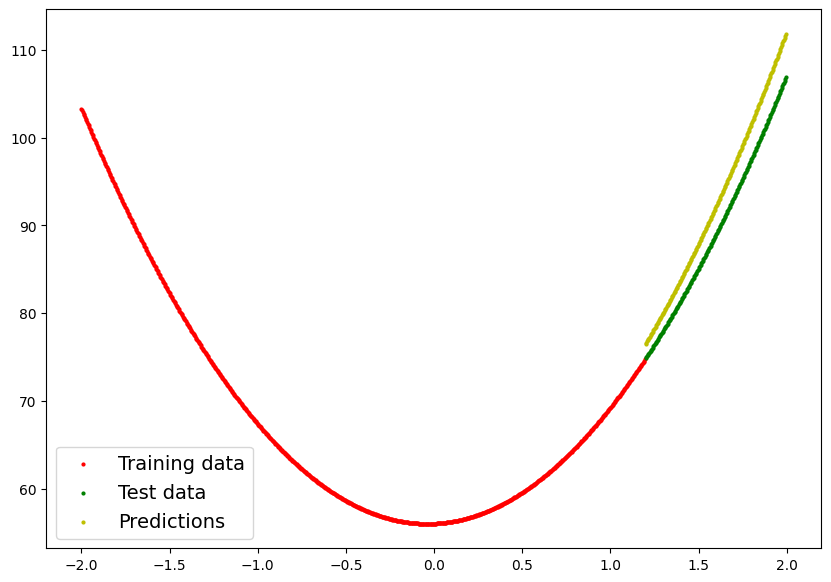

In [25]:
plot_predictions(X_train, z_train, X_test, z_test, predictions=z_preds_new)

In [26]:
from saveModel import save_model

#save_model(model_0, "chapter_1_practice_2_model_0.pth")

In [27]:
loaded_model_0 = LinearRegressionModel()
print(loaded_model_0.state_dict())

# load the saves state_dict of model_0, this will update the state_dict of the new model (with the stored one's parameters)
loaded_model_0.load_state_dict(torch.load(f="models/chapter_1_practice_2_model_0.pth"))

OrderedDict([('weights', tensor([-0.4140])), ('bias', tensor([1.5172])), ('const', tensor([0.0473]))])


<All keys matched successfully>

In [28]:
loaded_model_0.state_dict()

OrderedDict([('weights', tensor([12.3232])),
             ('bias', tensor([0.9583])),
             ('const', tensor([55.9747]))])